In [ ]:
%%capture
!pip install umap-learn

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from google.colab import drive
from matplotlib import colors as mcolors
#XD

In [ ]:
drive.mount('/content/drive/')


Mounted at /content/drive/


# ESTO SOLO SE ESTA HACIENDO CON LA DATA EXTRAIDA DE R2+1 con FINETUNING, FALTA HACER EL MISMO ANALISIS CON LA DATA EXTRAIDA SIN EL FINETUNING

In [ ]:
path = '/content/drive/MyDrive/UTEC/Ciclo 5/Machine Learning/Proyectos/Proyecto Clustering/csv_data/train_data_r2plus1d_18_16_kinetics.csv'
path2 = '/content/drive/MyDrive/UTEC/Ciclo 5/Machine Learning/Proyectos/Proyecto Clustering/csv_data/train_data_r2plus1d_34_8_ig65m_ft_kinetics.csv'
path3 = '/content/drive/MyDrive/UTEC/Ciclo 5/Machine Learning/Proyectos/Proyecto Clustering/csv_data/train_data_r2plus1d_34_32_ig65m_ft_kinetics.csv'
# train_data_r2plus1d_34_8_ig65m_ft_kinetics.csv
train_data = pd.read_csv(path)
train_data2 = pd.read_csv(path2)
train_data3 = pd.read_csv(path3)

In [ ]:
train_data.head()

,youtube_id,0,1,2,3,4,5,6,7,8,...,503,504,505,506,507,508,509,510,511,0.1
0,nHTC03tkqJE,0.633441,1.477009,1.084698,0.251182,0.482776,0.611685,0.388035,1.227611,0.599522,...,0.083918,1.052206,0.447844,0.788056,0.919416,1.137374,0.679473,1.064408,0.386685,shot put
1,wDWWMsBb5Jk,0.558813,0.491291,0.409237,0.538710,0.650371,0.634640,0.975703,0.657300,0.473841,...,0.889775,0.701789,0.331654,0.797082,0.728809,0.913215,0.398363,0.633861,0.267369,fixing hair
2,GiOmBE2gZB8,1.090307,0.495802,0.630082,0.622347,1.080397,0.687247,0.474273,1.047363,0.362344,...,0.504390,1.149327,0.852484,0.934690,0.788101,1.657272,0.352081,1.419306,0.265937,fixing hair
3,uLCjKfT1quw,1.088844,0.791276,0.107079,1.532411,1.132324,0.028671,0.568585,1.174348,0.638610,...,0.368715,0.398350,0.164028,0.413954,0.493855,0.660819,2.084928,0.160790,0.510926,fixing hair
4,MHIEhrMq1A4,0.623611,0.690614,0.360180,0.672388,1.122449,1.428524,0.382309,0.732833,0.517979,...,0.821191,0.341408,0.528179,0.806501,0.331601,0.703048,0.464997,1.175799,0.536439,dying hair


In [ ]:
print(train_data.info())
print("--------")
print(train_data2.info())
print("--------")
print(train_data3.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5414 entries, 0 to 5413
Columns: 514 entries, youtube_id to 0.1
dtypes: float64(512), object(2)
memory usage: 21.2+ MB
None
--------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5415 entries, 0 to 5414
Columns: 514 entries, youtube_id to 0.1
dtypes: float64(512), object(2)
memory usage: 21.2+ MB
None
--------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5409 entries, 0 to 5408
Columns: 514 entries, youtube_id to 0.1
dtypes: float64(512), object(2)
memory usage: 21.2+ MB
None


Vemos que las features van de 0 a 511 y que la cantidad de datos varia para cada método, uno itene 5414, 5415 y 5409. En sí la diferencia no es muy grave.

La columna 0.1 es nuestro label

In [ ]:
# Rename 0.1 col
train_data = train_data.rename(columns={'0.1': 'label'})
train_data2 = train_data2.rename(columns={'0.1': 'label'})
train_data3 = train_data3.rename(columns={'0.1': 'label'})
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5414 entries, 0 to 5413
Columns: 514 entries, youtube_id to label
dtypes: float64(512), object(2)
memory usage: 21.2+ MB


In [ ]:
print(train_data.isna().sum().sum())
print(train_data2.isna().sum().sum())
print(train_data3.isna().sum().sum())

0
0
0


En todo el dataset no hay ningun Nan, por lo que no tendremos problemas de valores faltantes en la data.

<ipython-input-13-e55811da9fd6>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette='hls')


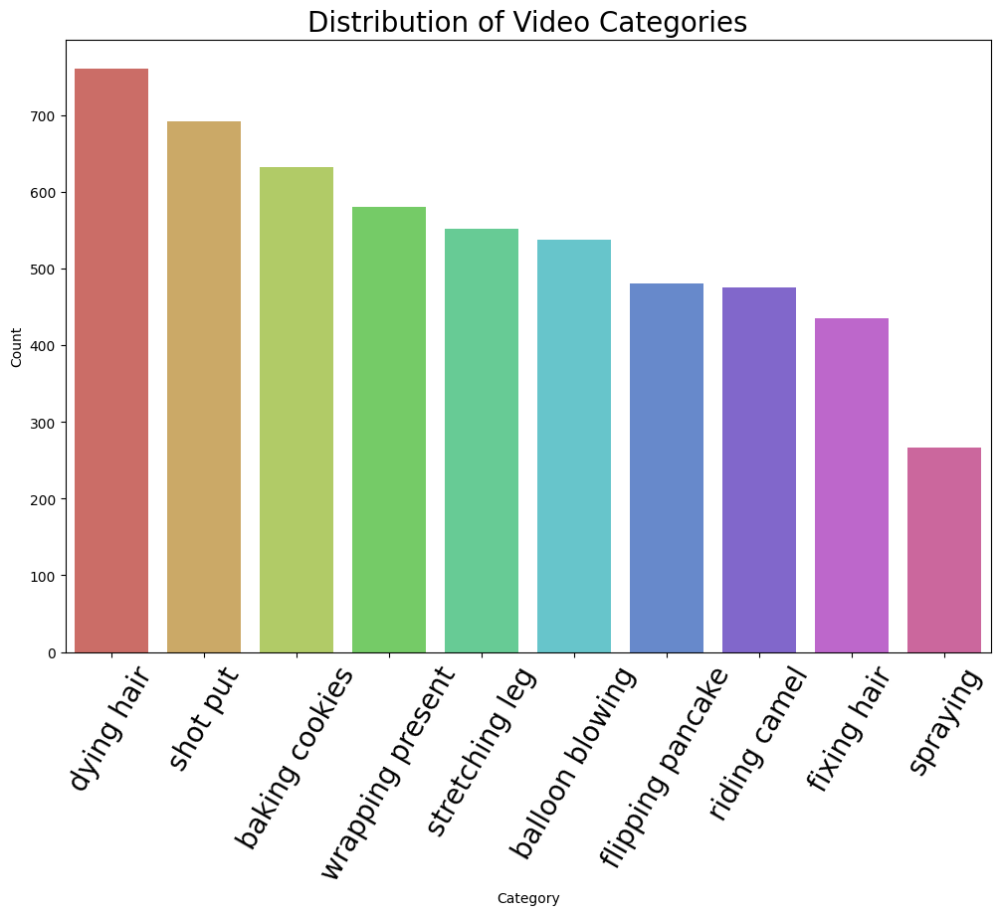

In [ ]:
#@title Distribución de categorias de los videos


category_counts = train_data['label'].value_counts()

plt.figure(figsize=(12, 8))
sns.barplot(x=category_counts.index, y=category_counts.values, palette='hls')
plt.xticks(rotation=60)
plt.xticks(fontsize=20)
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Distribution of Video Categories',  fontsize=20)
plt.show()


Vemos que tenemos un dataset medianamente desbalanceado en cuanto a las categorias de los videos, habiendo una mayor presencia en `pintarse el cabello`, `lanzanmiento de bala` y `cocinar galletas`.

Para la categoría con menor presencia, definitivamente es `spraying`.

<ipython-input-15-d64f392ddbd3>:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


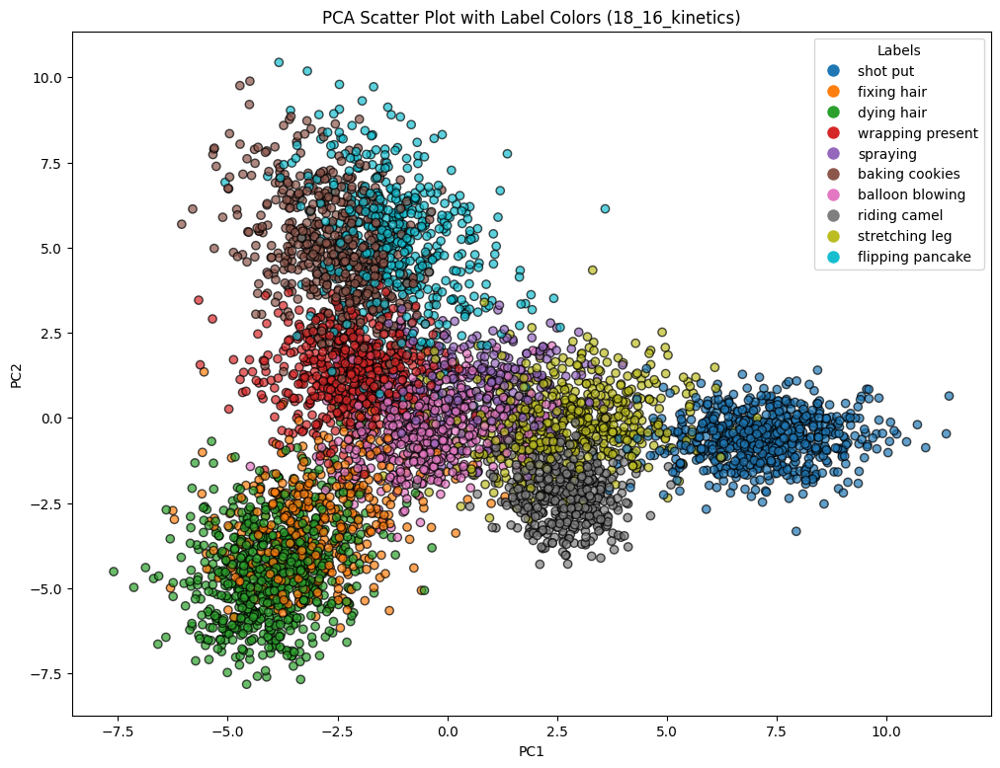

<ipython-input-15-d64f392ddbd3>:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


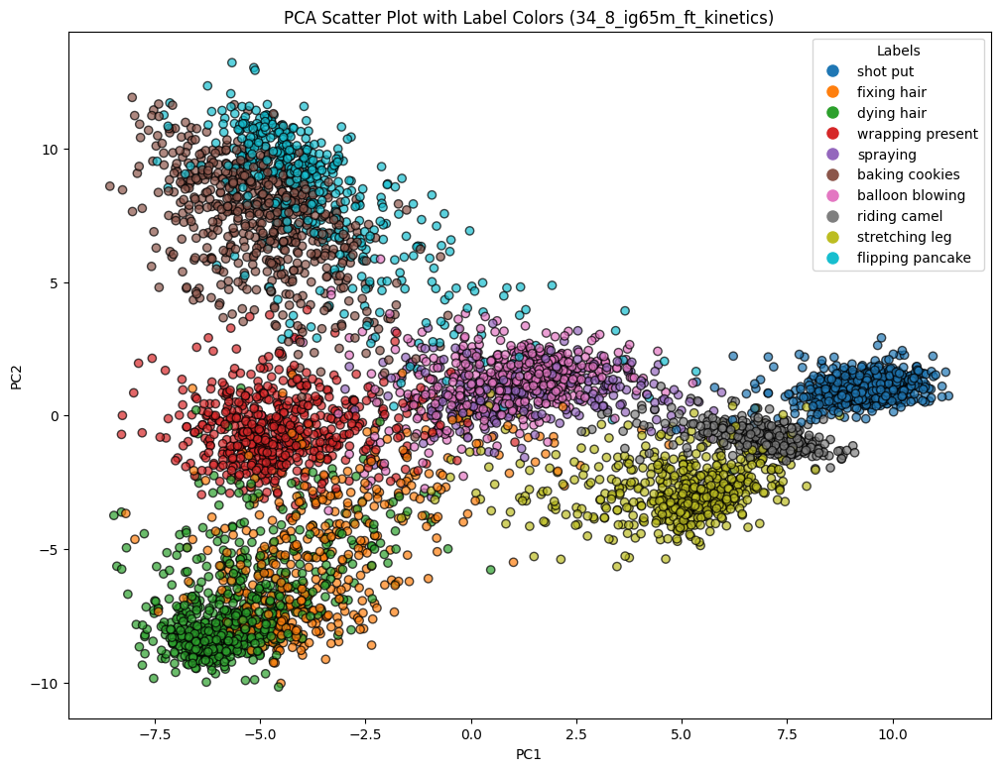

<ipython-input-15-d64f392ddbd3>:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


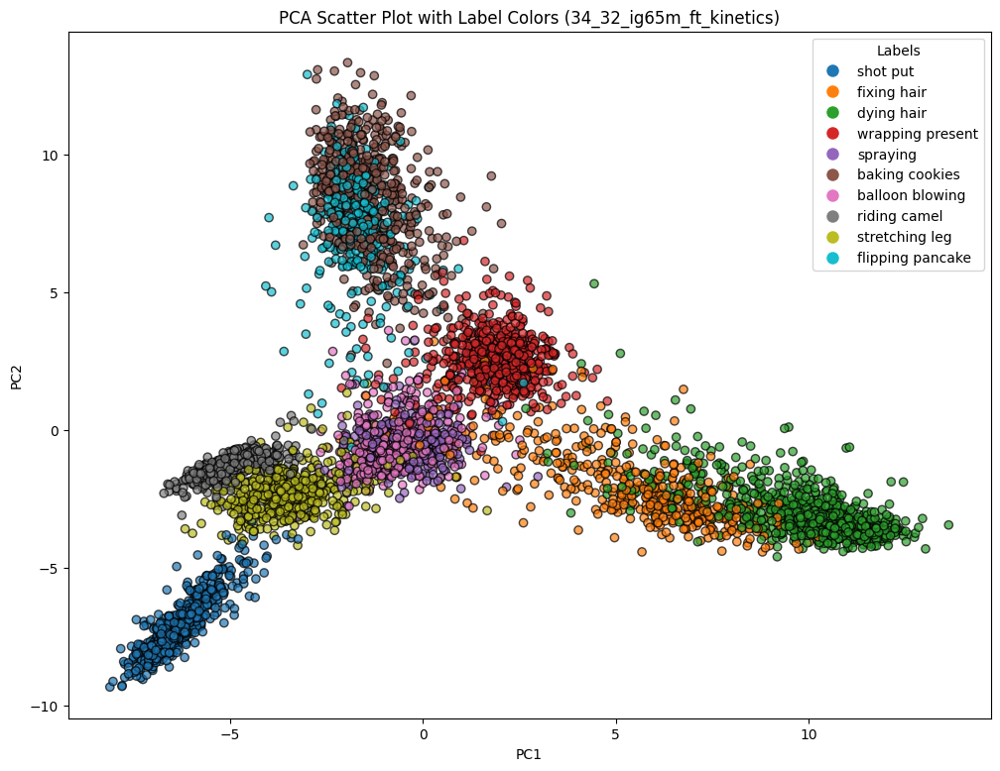

In [ ]:
#@title PCA y Visualización
from sklearn.decomposition import PCA

# Function to perform PCA and plot the results
def plot_pca(data, title):
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in data['label']]

    # Plotting
    plt.figure(figsize=(12, 9))
    scatter = plt.scatter(pca_data[:, 0], pca_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)

    # Create a legend with unique labels and their corresponding colors
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    plt.legend(handles=legend_elements, title="Labels")

    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title(title)
    plt.show()

# Aplicar PCA y graficar para cada DataFrame
plot_pca(train_data, 'PCA (18_16_kinetics)')
plot_pca(train_data2, 'PCA (34_8_ig65m_ft_kinetics)')
plot_pca(train_data3, 'PCA (34_32_ig65m_ft_kinetics)')



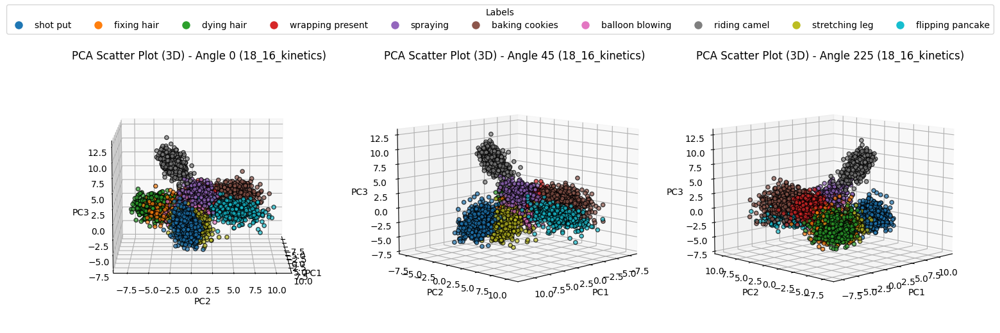

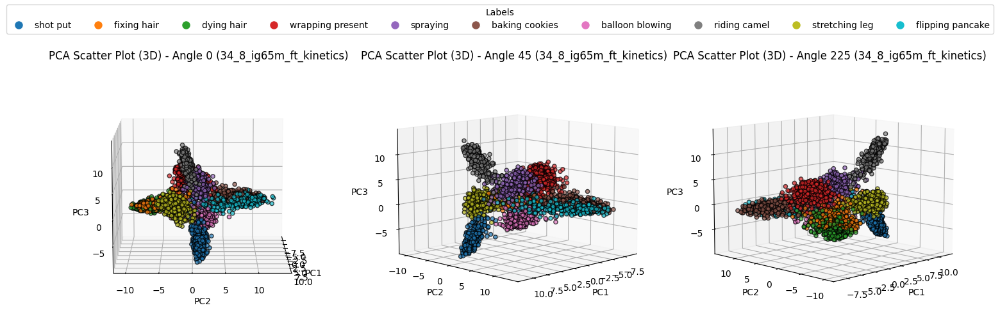

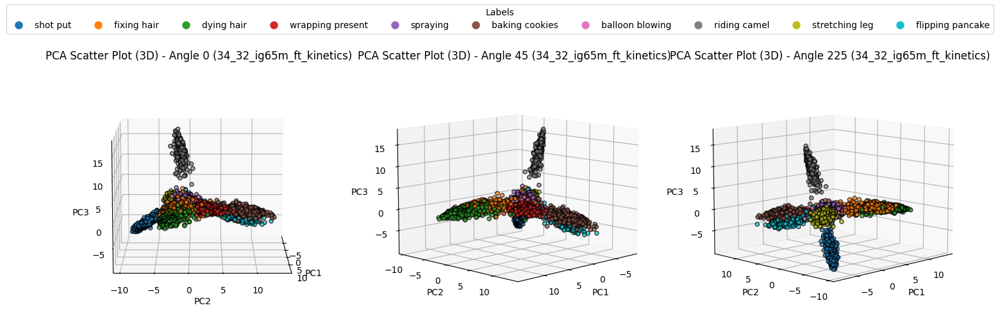

In [ ]:
#@title PCA y Visualización en 3D
from mpl_toolkits.mplot3d import Axes3D

def plot_pca_3d(train_data, name):
    pca_3d = PCA(n_components=3)
    pca_data_3d = pca_3d.fit_transform(train_data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = train_data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in train_data['label']]

    fig = plt.figure(figsize=(18, 6))

    def plot_scatter(angle, ax):
        ax.scatter(pca_data_3d[:, 0], pca_data_3d[:, 1], pca_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7)
        ax.view_init(elev=10., azim=angle)
        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_zlabel('PC3')
        ax.set_title(f'PCA Scatter Plot (3D) - Angle {angle} ({name})')

    # Gráfico default
    ax = fig.add_subplot(131, projection='3d')
    plot_scatter(0, ax)

    # Gráfico con azim=45
    ax = fig.add_subplot(132, projection='3d')
    plot_scatter(45, ax)

    # Gráfico con azim=225
    ax = fig.add_subplot(133, projection='3d')
    plot_scatter(225, ax)

    # Leyenda
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    fig.legend(handles=legend_elements, title="Labels", loc='upper center', ncol=len(unique_labels))

    plt.show()

# Assuming you have three dataframes: df1, df2, and df3
plot_pca_3d(train_data, '18_16_kinetics')
plot_pca_3d(train_data2, '34_8_ig65m_ft_kinetics')
plot_pca_3d(train_data3, '34_32_ig65m_ft_kinetics')



<ipython-input-7-b1775bbd832d>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(umap_data[:, 0], umap_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


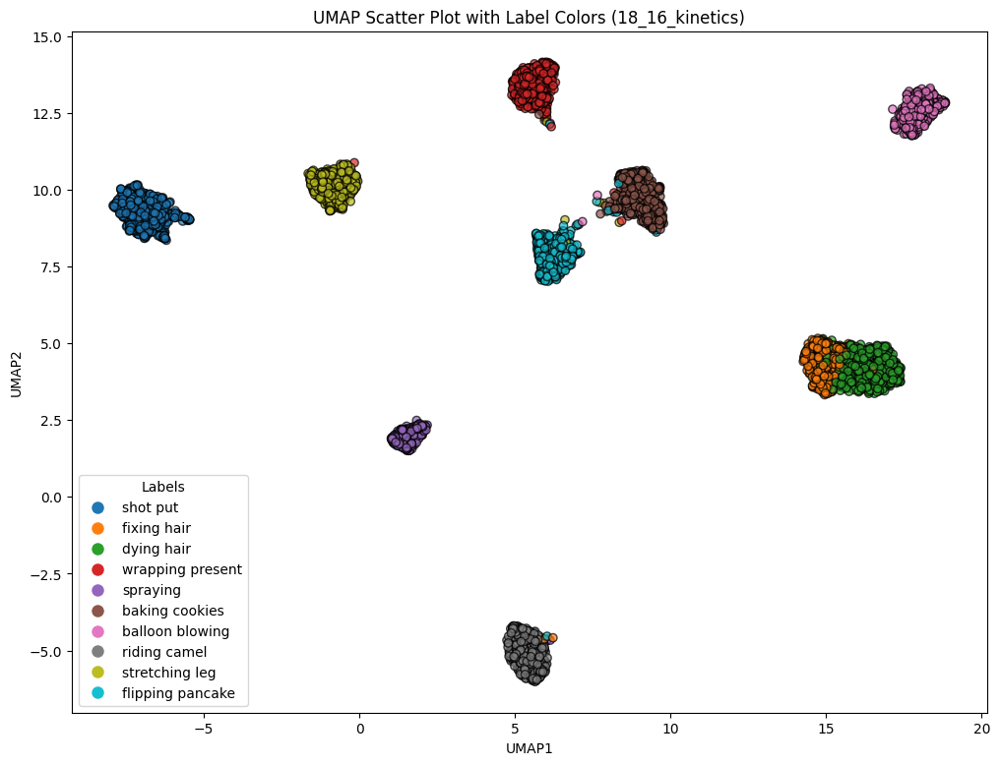

<ipython-input-7-b1775bbd832d>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(umap_data[:, 0], umap_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


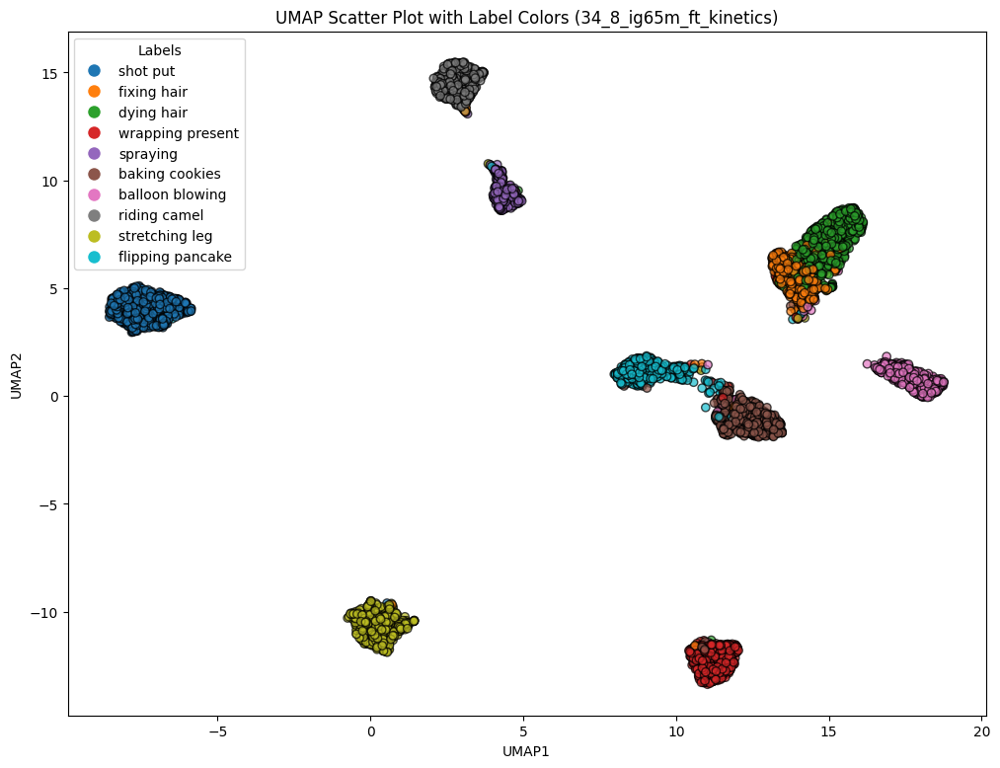

<ipython-input-7-b1775bbd832d>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(umap_data[:, 0], umap_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


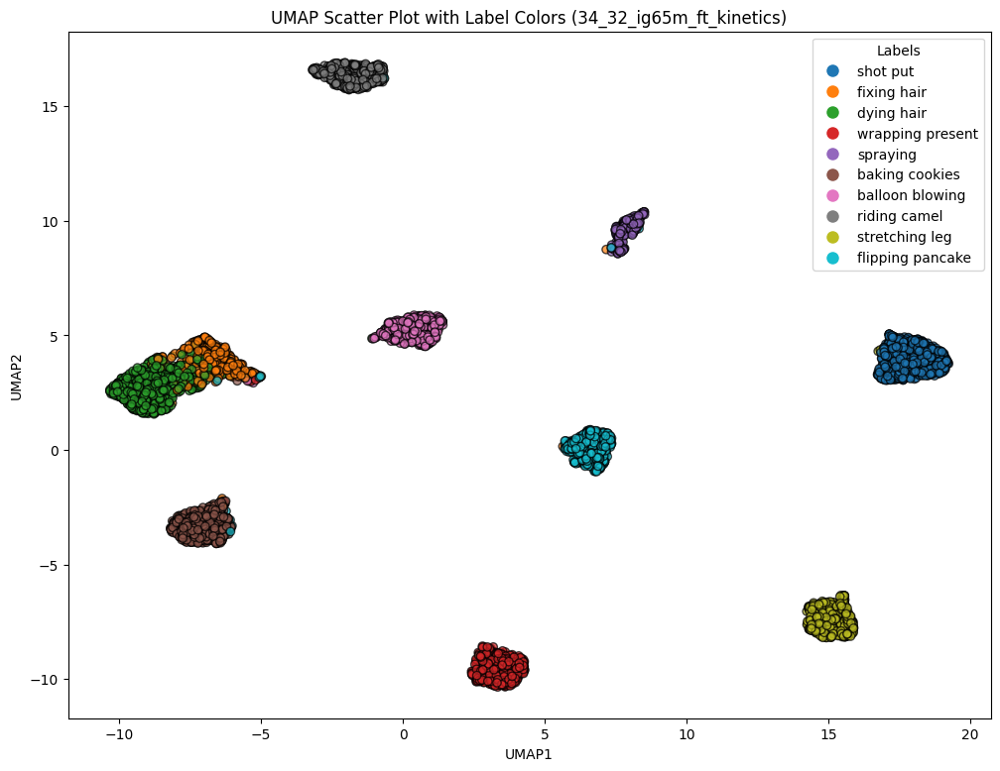

In [ ]:
import umap

def plot_umap_2d(data, title):
    reducer = umap.UMAP(n_components=2)
    umap_data = reducer.fit_transform(data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in data['label']]

    # Plotting
    plt.figure(figsize=(12, 9))
    scatter = plt.scatter(umap_data[:, 0], umap_data[:, 1], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)

    # Create a legend with unique labels and their corresponding colors
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    plt.legend(handles=legend_elements, title="Labels")

    plt.xlabel('UMAP1')
    plt.ylabel('UMAP2')
    plt.title(title)
    plt.show()

    # Aplicar UMAP y graficar en 2D para cada DataFrame
plot_umap_2d(train_data, 'UMAP Scatter Plot (18_16_kinetics)')
plot_umap_2d(train_data2, 'UMAP Scatter Plot (34_8_ig65m_ft_kinetics)')
plot_umap_2d(train_data3, 'UMAP Scatter Plot (34_32_ig65m_ft_kinetics)')


<ipython-input-8-80b08f2d9046>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(umap_data[:, 0], umap_data[:, 1], umap_data[:, 2], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


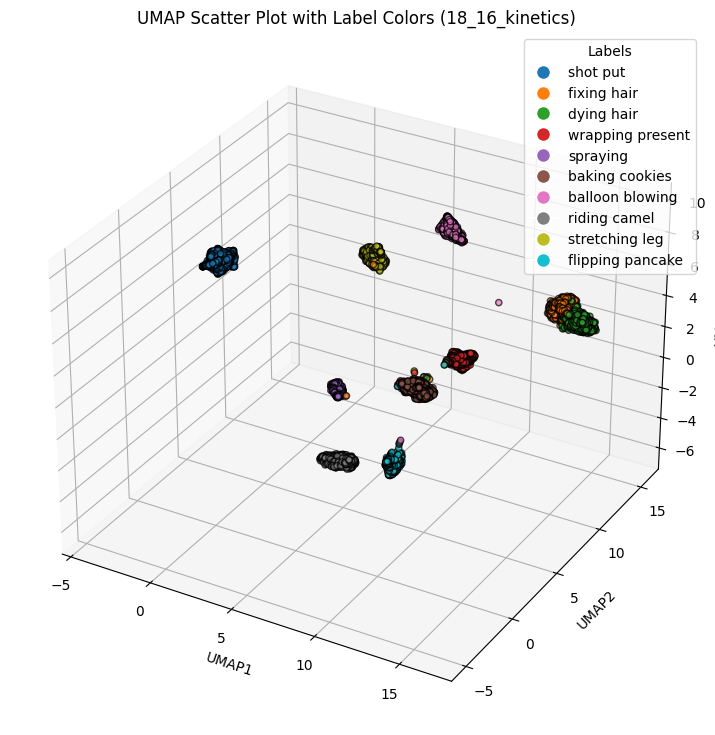

<ipython-input-8-80b08f2d9046>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(umap_data[:, 0], umap_data[:, 1], umap_data[:, 2], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


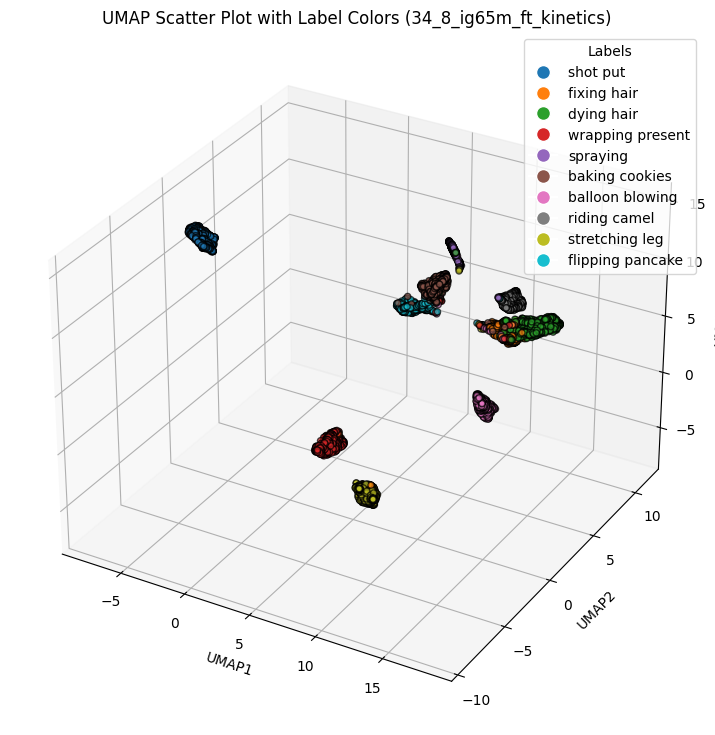

<ipython-input-8-80b08f2d9046>:14: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(umap_data[:, 0], umap_data[:, 1], umap_data[:, 2], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)


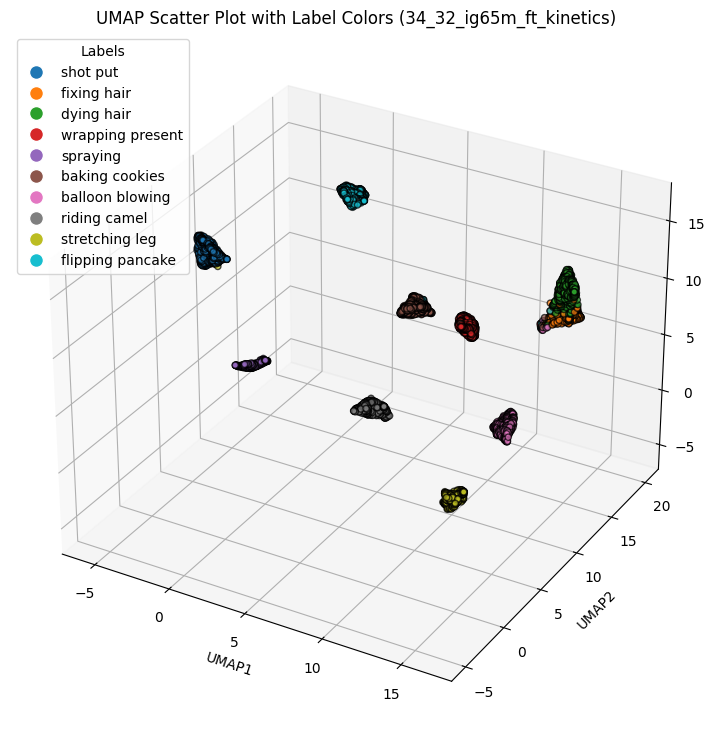

In [ ]:
# Función para realizar UMAP y graficar los resultados en 3D
def plot_umap_3d(data, title):
    reducer = umap.UMAP(n_components=3)
    umap_data = reducer.fit_transform(data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in data['label']]

    # Plotting
    fig = plt.figure(figsize=(12, 9))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(umap_data[:, 0], umap_data[:, 1], umap_data[:, 2], c=colors, cmap='gist_rainbow', edgecolors='k', alpha=0.7)

    # Create a legend with unique labels and their corresponding colors
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    ax.legend(handles=legend_elements, title="Labels")

    ax.set_xlabel('UMAP1')
    ax.set_ylabel('UMAP2')
    ax.set_zlabel('UMAP3')
    ax.set_title(title)
    plt.show()

# Aplicar UMAP y graficar en 3D para cada DataFrame
plot_umap_3d(train_data, 'UMAP Scatter Plot with Label Colors (18_16_kinetics)')
plot_umap_3d(train_data2, 'UMAP Scatter Plot with Label Colors (34_8_ig65m_ft_kinetics)')
plot_umap_3d(train_data3, 'UMAP Scatter Plot with Label Colors (34_32_ig65m_ft_kinetics)')

<ipython-input-9-de74064741a2>:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(tsne_data_2d[:, 0], tsne_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


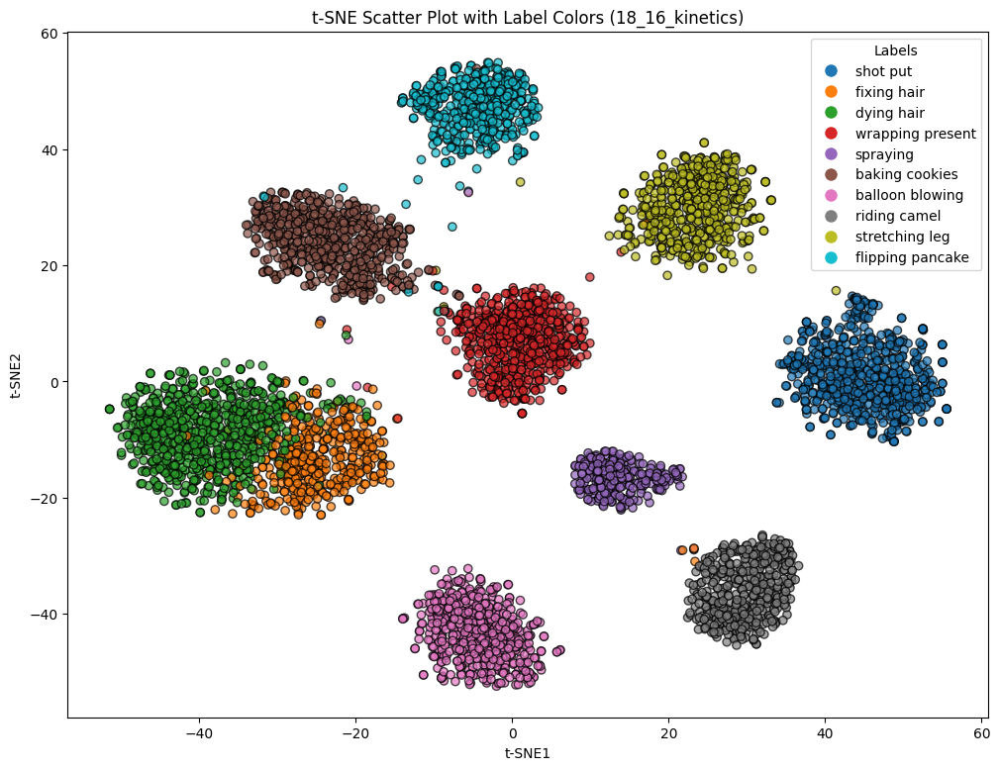

<ipython-input-9-de74064741a2>:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(tsne_data_2d[:, 0], tsne_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


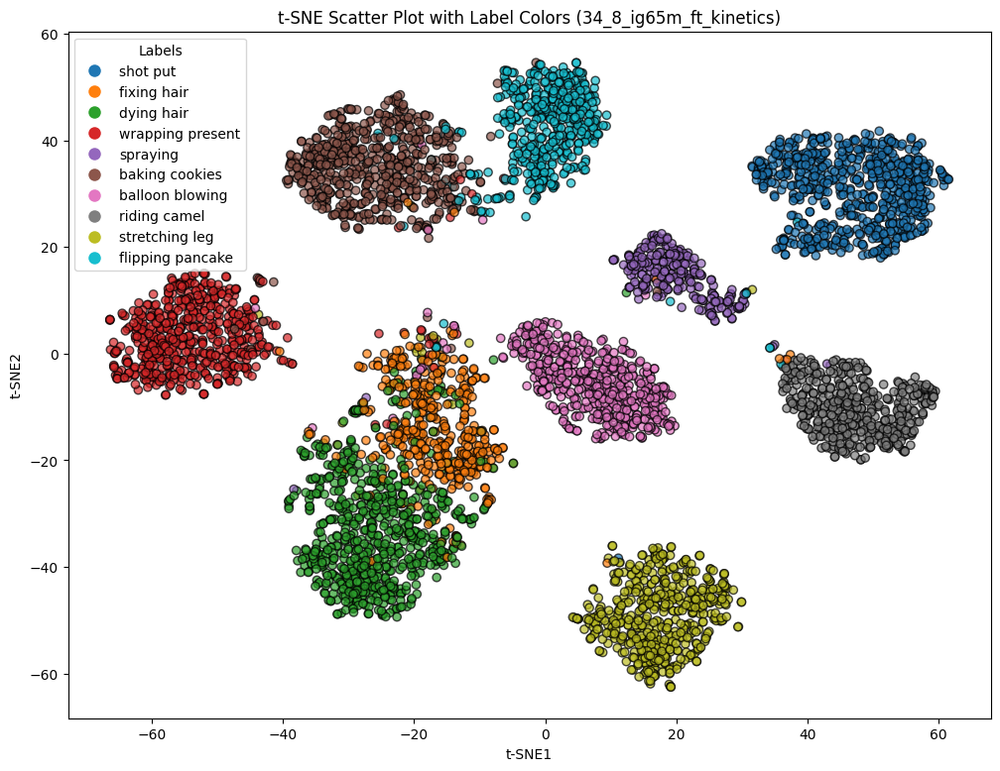

<ipython-input-9-de74064741a2>:17: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = plt.scatter(tsne_data_2d[:, 0], tsne_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


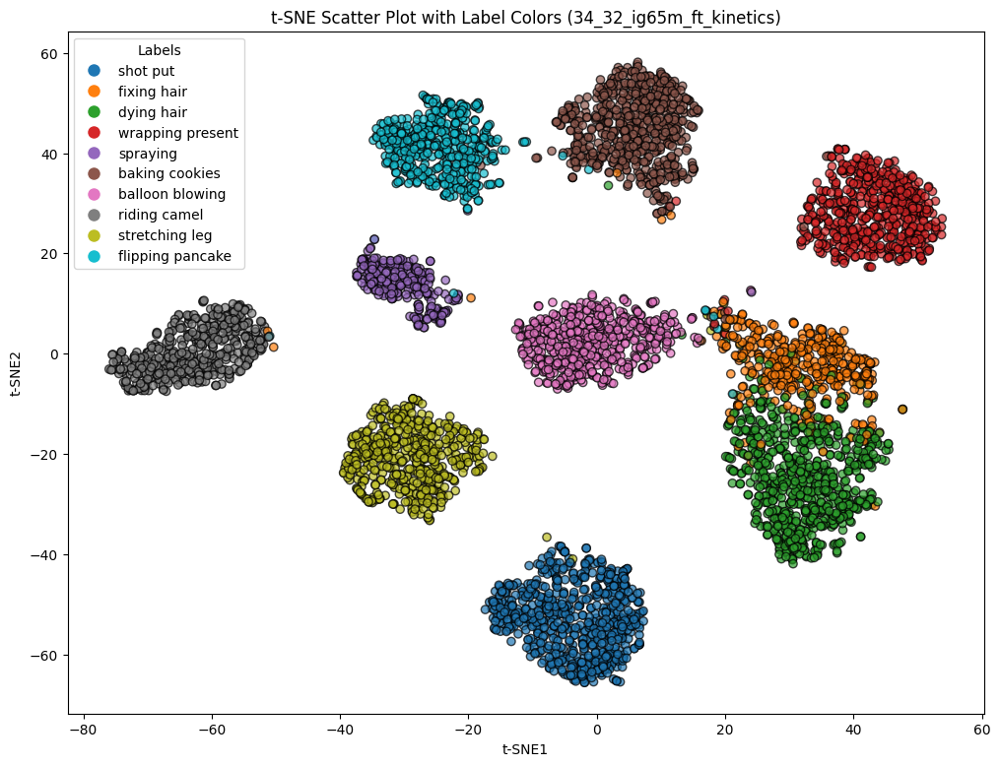

<ipython-input-9-de74064741a2>:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:54: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:63: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


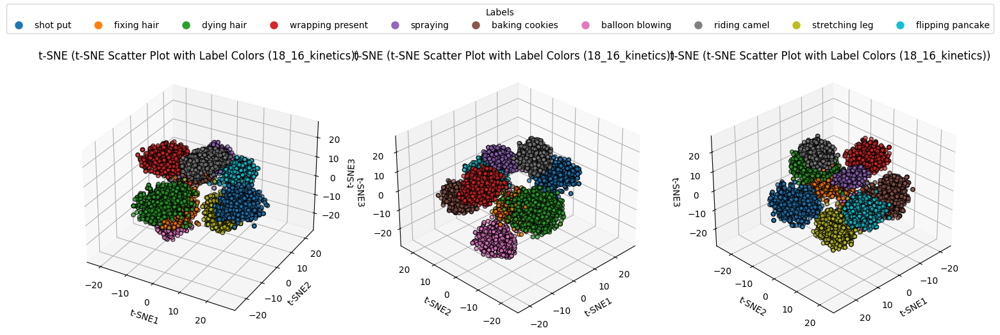

<ipython-input-9-de74064741a2>:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:54: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:63: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


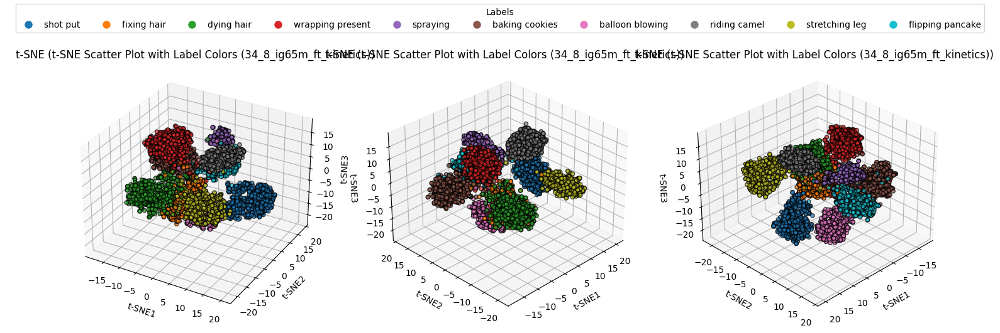

<ipython-input-9-de74064741a2>:43: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:54: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
<ipython-input-9-de74064741a2>:63: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


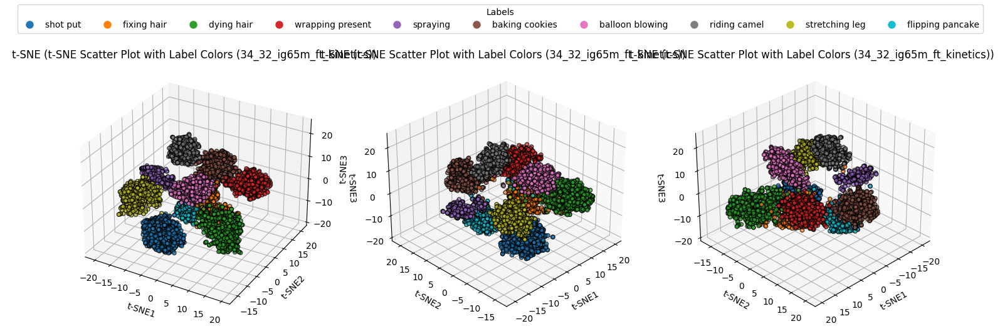

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

# Función para realizar t-SNE y graficar los resultados en 2D
def plot_tsne_2d(data, title):
    tsne_2d = TSNE(n_components=2, random_state=42)
    tsne_data_2d = tsne_2d.fit_transform(data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in data['label']]

    # Plotting
    plt.figure(figsize=(12, 9))
    scatter = plt.scatter(tsne_data_2d[:, 0], tsne_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')

    # Create a legend with unique labels and their corresponding colors
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    plt.legend(handles=legend_elements, title="Labels")

    plt.xlabel('t-SNE1')
    plt.ylabel('t-SNE2')
    plt.title(title)
    plt.show()

# Función para realizar t-SNE y graficar los resultados en 3D
def plot_tsne_3d(data, title):
    tsne_3d = TSNE(n_components=3, random_state=42)
    tsne_data_3d = tsne_3d.fit_transform(data.drop(['label', 'youtube_id'], axis=1))

    # Mapa de color para los labels
    unique_labels = data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in data['label']]

    # Gráfico 3D
    fig = plt.figure(figsize=(18, 6))

    # Gráfico con vista predeterminada
    ax = fig.add_subplot(131, projection='3d')
    scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
    # Leyenda
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    fig.legend(handles=legend_elements, title="Labels", loc='upper center', ncol=len(unique_labels))
    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_zlabel('t-SNE3')
    ax.set_title(f't-SNE ({title})')

    # Gráfico con vista azim=225
    ax = fig.add_subplot(132, projection='3d')
    scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
    ax.view_init(elev=30, azim=225)
    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_zlabel('t-SNE3')
    ax.set_title(f't-SNE ({title})')

    # Gráfico con vista azim=45
    ax = fig.add_subplot(133, projection='3d')
    scatter = ax.scatter(tsne_data_3d[:, 0], tsne_data_3d[:, 1], tsne_data_3d[:, 2], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
    ax.view_init(elev=30, azim=45)
    ax.set_xlabel('t-SNE1')
    ax.set_ylabel('t-SNE2')
    ax.set_zlabel('t-SNE3')
    ax.set_title(f't-SNE ({title})')

    plt.show()

# Aplicar t-SNE y graficar en 2D para cada DataFrame
plot_tsne_2d(train_data, 't-SNE Scatter Plot with Label Colors (18_16_kinetics)')
plot_tsne_2d(train_data2, 't-SNE Scatter Plot with Label Colors (34_8_ig65m_ft_kinetics)')
plot_tsne_2d(train_data3, 't-SNE Scatter Plot with Label Colors (34_32_ig65m_ft_kinetics)')

# Aplicar t-SNE y graficar en 3D para cada DataFrame
plot_tsne_3d(train_data, 't-SNE Scatter Plot with Label Colors (18_16_kinetics)')
plot_tsne_3d(train_data2, 't-SNE Scatter Plot with Label Colors (34_8_ig65m_ft_kinetics)')
plot_tsne_3d(train_data3, 't-SNE Scatter Plot with Label Colors (34_32_ig65m_ft_kinetics)')


A primera vista, vemos que las categorias de **gris, azul y mostaza** `(montando camello, lanzamiento de bala y estirando pierna)` son las que más se distinguen entre sí.

Para otros casos como verde y naranja `(pintarse el cabello y arreglandose el cabello)` o marrón y celeste `(horneando galletas y volteando un panqueque)` se ve que estan medianamente juntos y esto tiene sentido `ya que las acciones que estan realizando son parecidas. `

- Para el primer caso se involucra el manejo del pelo, la presencia de una cabeza humana, etc.

- Para el segundo caso se involucra un ambiente en la cocina, iluminación parecida, utensilios parecidos, uso de las manos, etc.

Poner screenshots en el paper de https://www.youtube.com/watch?v=qyTDZajMSqQ, https://www.youtube.com/watch?v=UxVnOPYmwXs y https://www.youtube.com/watch?v=CfXqIh8betw

En el caso de los colores morado y rosa (spraying y soplando un globo) se que en la visualización del PCA 2D estan sobrepuestos, `pero una vez visualizandolos en 3D (Angulo 45), se ve de manera más clara una separación entre ambas clases.` Sin embargo esto no sucede con el 3er metodo, en donde la mayoria de clases se ven muy aplanadas, ovaladas y sobrepuestas.

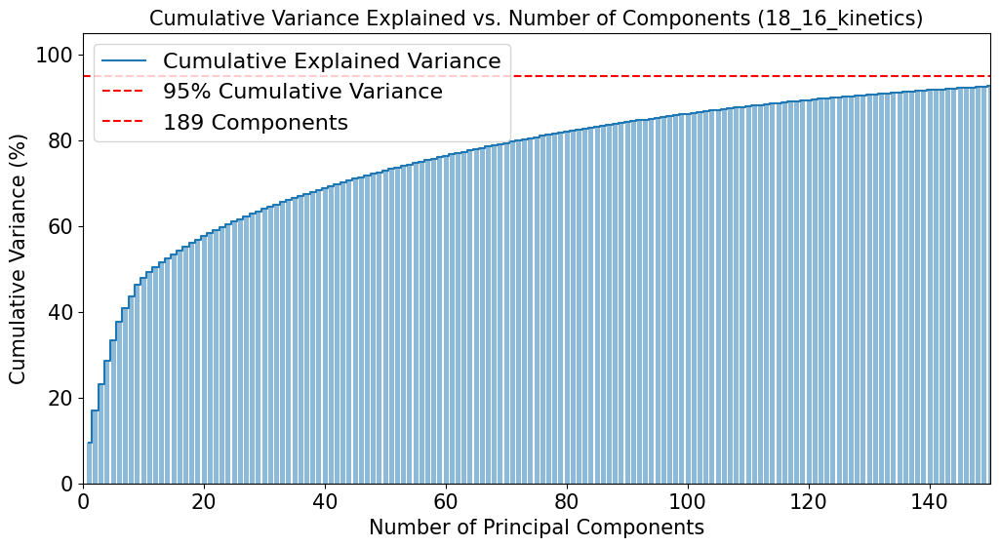

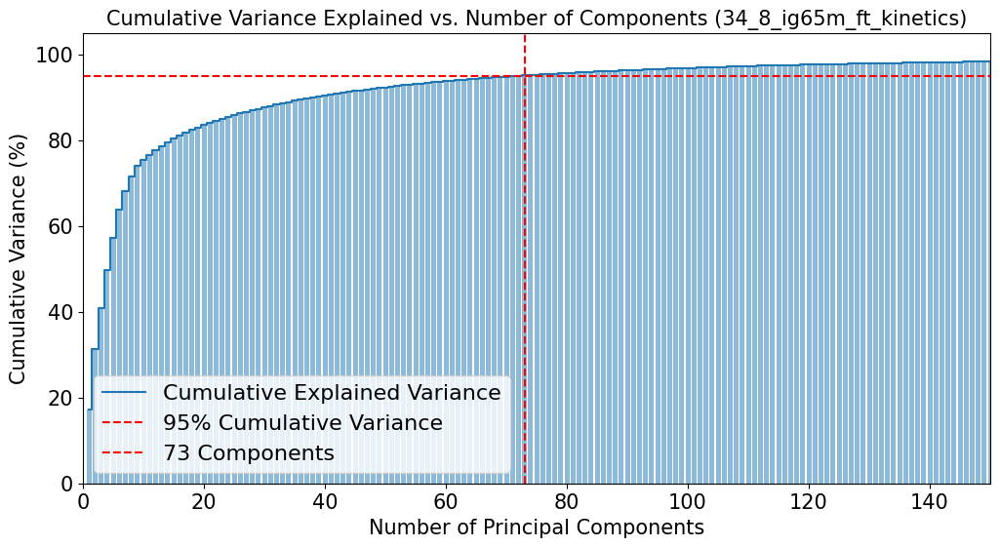

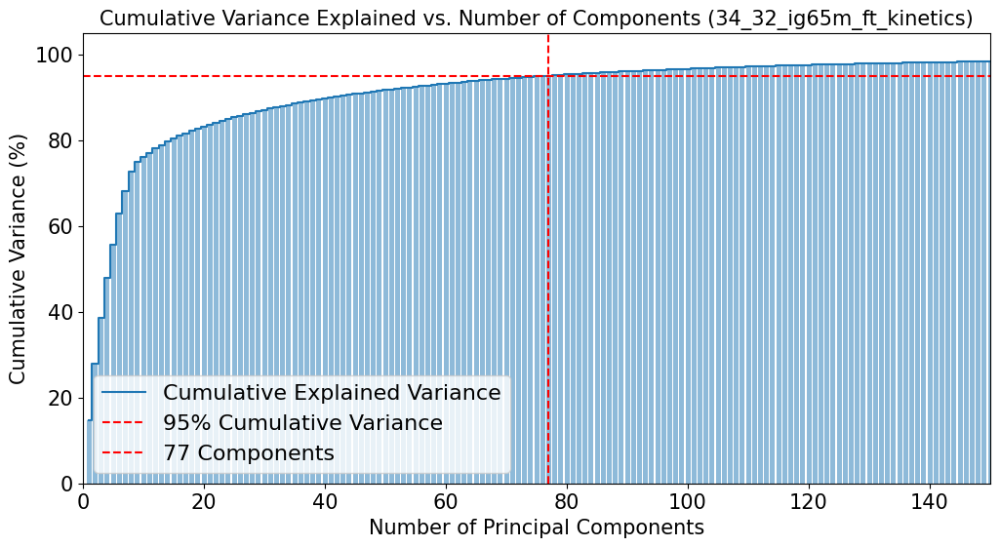

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def plot_cumulative_variance(train_data, name):
    pca = PCA().fit(train_data.drop(['label', 'youtube_id'], axis=1))
    cumulative_variance = pca.explained_variance_ratio_.cumsum()

    # Find the number of components required to reach 95% cumulative variance
    num_components = len(cumulative_variance[cumulative_variance <= 0.95]) + 1

    plt.figure(figsize=(12, 6))
    plt.bar(range(1, len(cumulative_variance) + 1), cumulative_variance * 100, alpha=0.5, align='center')
    plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance * 100, where='mid', label='Cumulative Explained Variance')
    plt.xlabel('Number of Principal Components', fontsize = 15)
    plt.xticks(fontsize=15)
    plt.ylabel('Cumulative Variance (%)', fontsize = 15)
    plt.yticks(fontsize=15)
    plt.title(f'Cumulative Variance Explained vs. Number of Components ({name})', fontsize = 15)
    plt.axhline(y=95, color='r', linestyle='--', label='95% Cumulative Variance')
    plt.axvline(x=num_components, color='r', linestyle='--', label=f'{num_components} Components')
    plt.xlim(0, 150)
    plt.legend(fontsize=16)
    plt.show()

# Call the function with the three dataframes
plot_cumulative_variance(train_data, '18_16_kinetics')
plot_cumulative_variance(train_data2, '34_8_ig65m_ft_kinetics')
plot_cumulative_variance(train_data3, '34_32_ig65m_ft_kinetics')

Vemos que hay una diferencia abismal en terminos del beneficio de usar PCA con las features extraidas con el metodo default que con los métodos finetuneados, necesitando la mitad de pca components en las features de los modelos finetuneados frente al modelo default. Esto en sí nos demuestra que tendremos una mayor ventaja al realizar la reducción de la dimensionalidad si usamos las features del modelo finetuneado.

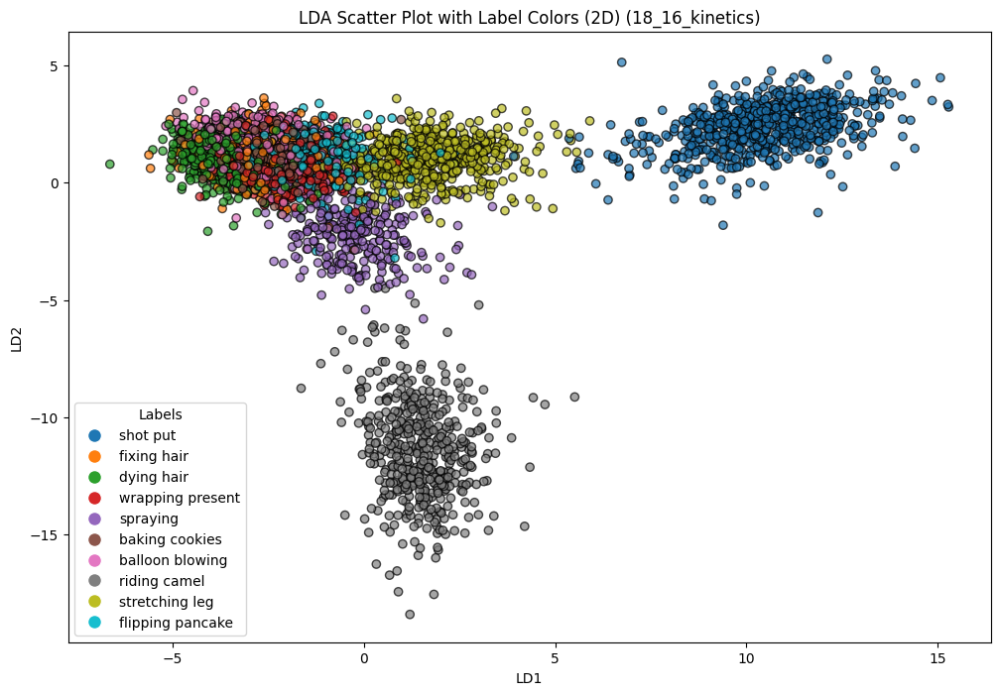

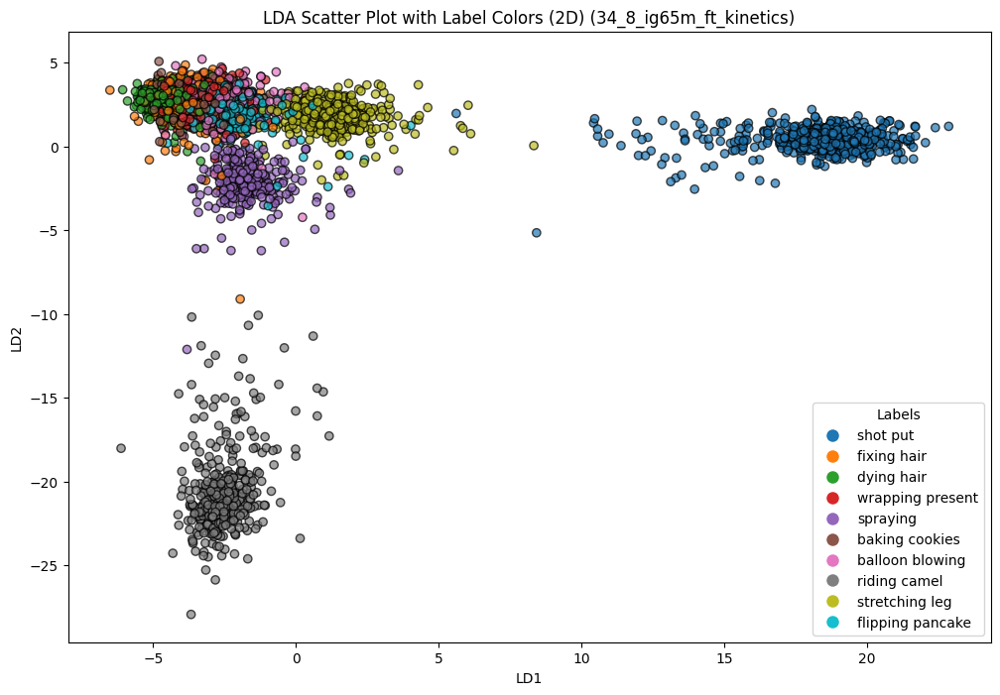

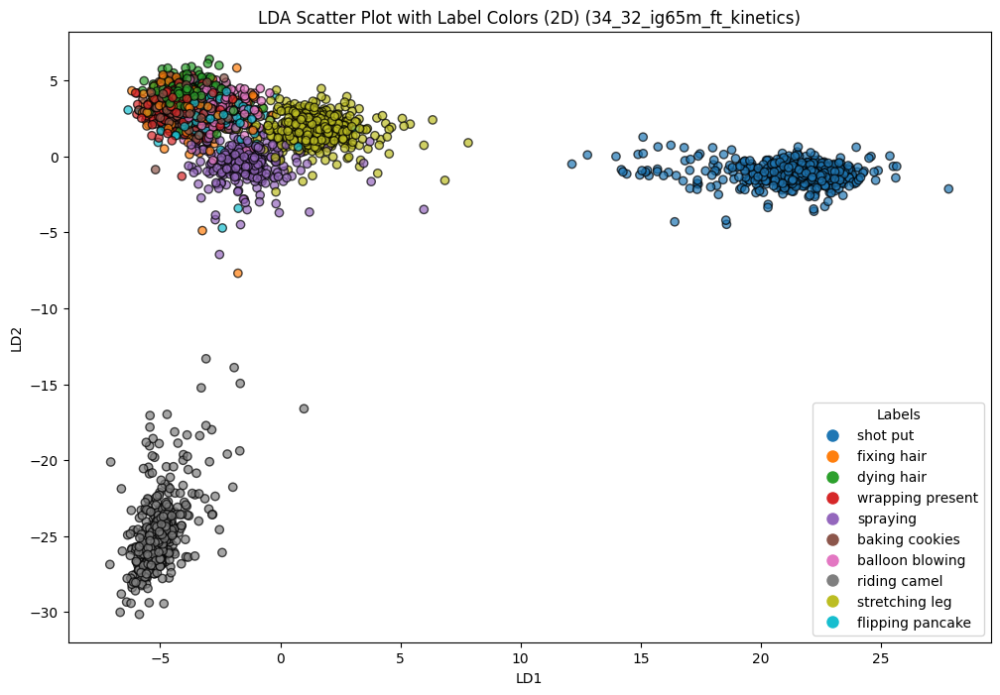

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

def plot_lda(train_data, name):
    # Assuming train_data is a DataFrame with features and a 'label' column
    lda = LDA(n_components=2)
    lda_data = lda.fit_transform(train_data.drop(['label', 'youtube_id'], axis=1), train_data['label'])

    # Mapa de color para los labels
    unique_labels = train_data['label'].unique()
    color_map = {label: idx for idx, label in enumerate(unique_labels)}
    colors = [plt.cm.tab10(color_map[label] % 10) for label in train_data['label']]

    # Gráfico 2D
    plt.figure(figsize=(12, 8))
    scatter = plt.scatter(lda_data[:, 0], lda_data[:, 1], c=colors, edgecolors='k', alpha=0.7)

    # Crear una leyenda con etiquetas únicas y sus colores correspondientes
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
    plt.legend(handles=legend_elements, title="Labels")

    plt.xlabel('LD1')
    plt.ylabel('LD2')
    plt.title(f'LDA Scatter Plot with Label Colors (2D) ({name})')
    plt.show()

# Call the function with the three dataframes
plot_lda(train_data, '18_16_kinetics')
plot_lda(train_data2, '34_8_ig65m_ft_kinetics')
plot_lda(train_data3, '34_32_ig65m_ft_kinetics')

Un análisis similar al del PCA, sin embargo, con el LDA se puede concluir que las clases más faciles de separar serian la azul, gris, mostaza y ligeramente Morado son las más faciles de separar. Esto puede deberse a la naturaleza de los videos de cada una, ya que se distinguen bastante entre sí. A diferencia de las otras clases que tal vez involucran un ambiente más hogareño, mayor enfoque en el cuerpo humano, etc (VISUALIZAR VIDEOS PARA COMPROBAR)

### Ahora, será posible escoger las mejores features y para una reducción más efectiva de nuestro dataset?

<ipython-input-24-ffe92b8deceb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_n_features['importance'] = top_n_features['importance'] * 100


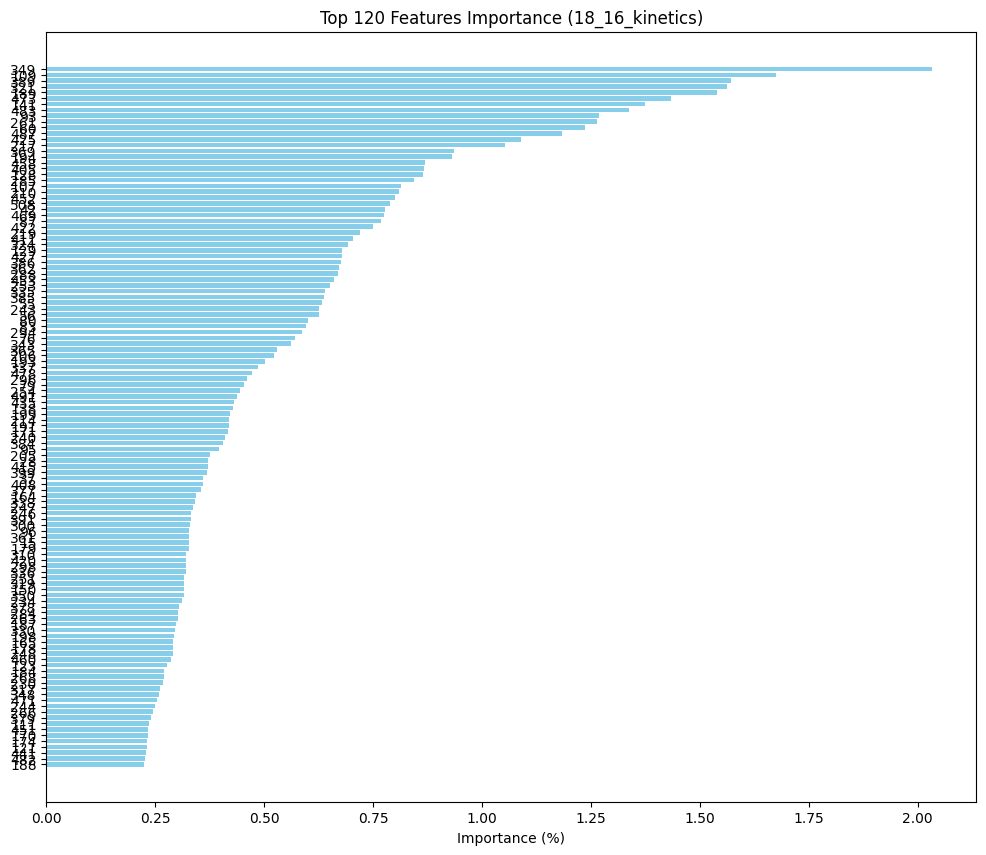

<ipython-input-24-ffe92b8deceb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_n_features['importance'] = top_n_features['importance'] * 100


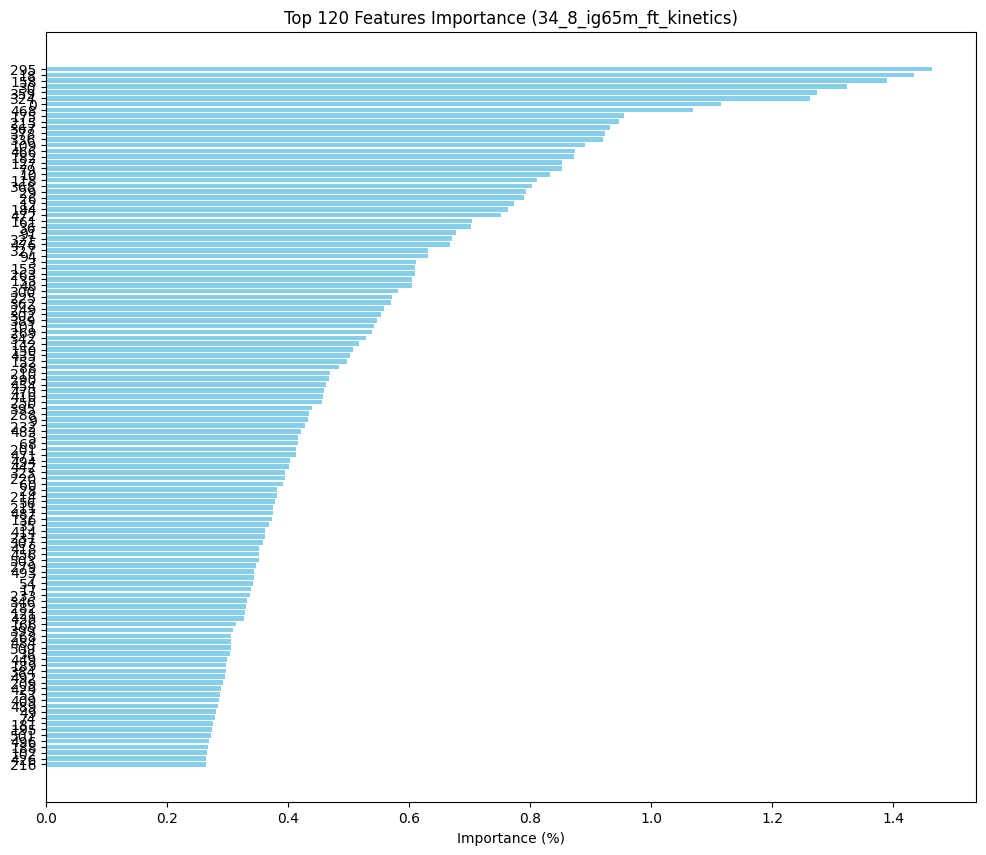

<ipython-input-24-ffe92b8deceb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_n_features['importance'] = top_n_features['importance'] * 100


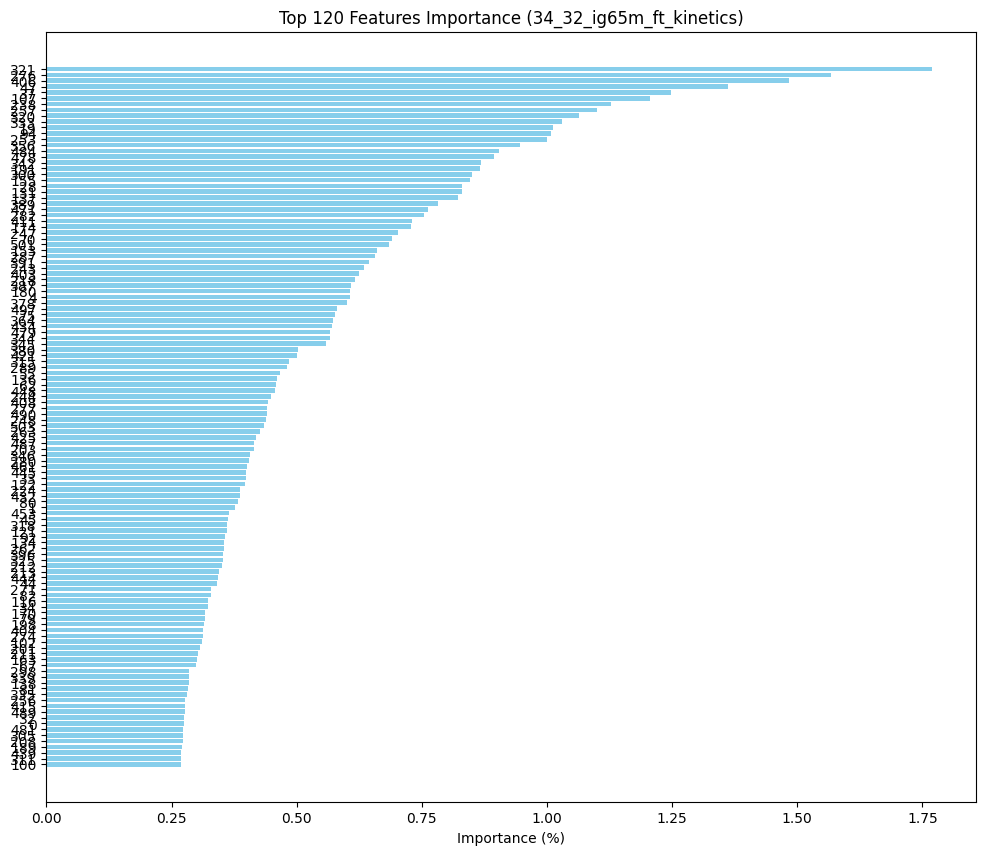

In [ ]:

from sklearn.ensemble import RandomForestClassifier

def plot_feature_importance(train_data, name, top_n=120):
    X = train_data.drop(['label', 'youtube_id'], axis=1)
    y = train_data['label']

    # Entrenar un modelo de Random Forest
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)

    feature_importances = rf.feature_importances_

    feature_importance_df = pd.DataFrame({
        'feature': X.columns,
        'importance': feature_importances
    })

    feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

    top_n_features = feature_importance_df.head(top_n)

    # Convertir la importancia en porcentaje
    top_n_features['importance'] = top_n_features['importance'] * 100

    plt.figure(figsize=(12, 10))
    plt.barh(top_n_features['feature'], top_n_features['importance'], color='skyblue')
    plt.xlabel('Importance (%)')
    plt.title(f'Top {top_n} Features Importance ({name})')
    plt.gca().invert_yaxis()
    plt.show()

# Call the function with the three dataframes
plot_feature_importance(train_data, '18_16_kinetics')
plot_feature_importance(train_data2, '34_8_ig65m_ft_kinetics')
plot_feature_importance(train_data3, '34_32_ig65m_ft_kinetics')

<ipython-input-16-6069cfde88b3>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_n_features['importance'] = top_n_features['importance'] * 100


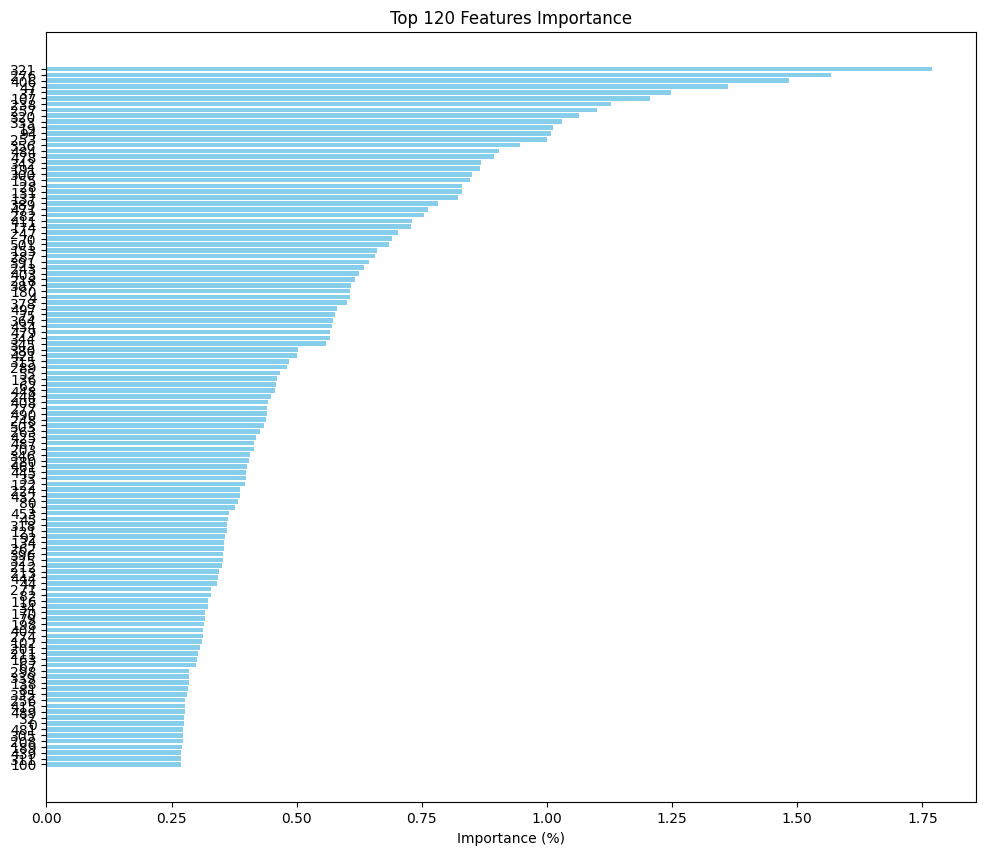

In [ ]:
from sklearn.ensemble import RandomForestClassifier

X = train_data.drop(['label', 'youtube_id'], axis=1)
y = train_data['label']

# Entrenar un modelo de Random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

feature_importances = rf.feature_importances_

feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': feature_importances
})

feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

top_n = 120  # Número de características más importantes
top_n_features = feature_importance_df.head(top_n)

# Convertir la importancia en porcentaje
top_n_features['importance'] = top_n_features['importance'] * 100

plt.figure(figsize=(12, 10))
plt.barh(top_n_features['feature'], top_n_features['importance'], color='skyblue')
plt.xlabel('Importance (%)')
plt.title(f'Top {top_n} Features Importance')
plt.gca().invert_yaxis()
plt.show()


Es claro que algunas features pueden ayudar a clasificar de mejor manera a determinar si un video es de una determinada categoria y lo podemos demostrar justo con este gráfico. Sin embargo, la diferencia entre ellas es muy baja en sí, además de que la cantidad de features (511) no merita realizarle una doble reducción a comparación de datasets con una mayor cantidad de features (más de mil o 2 mil features)

In [ ]:
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import rand_score, mutual_info_score, silhouette_score, davies_bouldin_score
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)

    # Check if there is only one cluster
    if len(set(labels)) == 1:
        return -1  # Assign a low Silhouette Score
    else:
        return silhouette_score(X, labels)

def apply_clustering(train_data, name):
    X = train_data.drop(['label', 'youtube_id'], axis=1)
    y = train_data['label']

    # Top 100 PCA components
    pca = PCA(n_components=100)
    X_pca = pca.fit_transform(X)

    print(f"\nUsing Top 100 PCA Components ({name}):")
    apply_clustering_with_data(X_pca, y, name)

    # Top 100 features based on feature importance
    rf = RandomForestClassifier(n_estimators=100, random_state=42)
    rf.fit(X, y)
    feature_importances = rf.feature_importances_

    feature_importance_df = pd.DataFrame({
        'feature': X.columns,
        'importance': feature_importances
    })

    feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)
    top_100_features = feature_importance_df.head(100)['feature']
    X_top_features = train_data[top_100_features]

    print(f"\nUsing Top 100 Features ({name}):")
    apply_clustering_with_data(X_top_features, y, name)

def apply_clustering_with_data(X, y, name):
    # K-Means Clustering
    kmeans_params = {'n_clusters': [10], 'n_init': [10]}  # Set n_init explicitly
    kmeans_grid = GridSearchCV(KMeans(n_init=10), kmeans_params, scoring=silhouette_scorer, cv=5)  # Set n_init explicitly
    kmeans_grid.fit(X)

    kmeans_best = kmeans_grid.best_estimator_
    kmeans_labels = kmeans_best.labels_

    print(f"K-Means Clustering ({name}):")
    print(f"Best Parameters: {kmeans_grid.best_params_}")
    print(f"Rand Index: {rand_score(y, kmeans_labels):.2f}")
    print(f"Mutual Information-based Score: {mutual_info_score(y, kmeans_labels):.2f}")
    print(f"Silhouette Score: {silhouette_score(X, kmeans_labels):.2f}")
    print(f"Davies-Bouldin Score: {davies_bouldin_score(X, kmeans_labels):.2f}")
    print()

    # Gaussian Mixture Model (GMM)
    gmm_params = {'n_components': [10]}  # Consider only 10 clusters
    gmm = GaussianMixture(n_components=10)
    gmm.fit(X)
    gmm_labels = gmm.predict(X)

    print(f"Gaussian Mixture Model ({name}):")
    print(f"Rand Index: {rand_score(y, gmm_labels):.2f}")
    print(f"Mutual Information-based Score: {mutual_info_score(y, gmm_labels):.2f}")
    print(f"Silhouette Score: {silhouette_score(X, gmm_labels):.2f}")
    print(f"Davies-Bouldin Score: {davies_bouldin_score(X, gmm_labels):.2f}")
    print()

    # DBSCAN Clustering
    '''
    dbscan_params = {'eps': [0.1, 0.5, 1, 1.5, 2], 'min_samples': range(2, 11)}
    dbscan_grid = GridSearchCV(DBSCAN(), dbscan_params, scoring=silhouette_scorer, cv=5)
    dbscan_grid.fit(X)

    dbscan_best = dbscan_grid.best_estimator_
    dbscan_labels = dbscan_best.labels_

    print(f"DBSCAN Clustering ({name}):")
    print(f"Best Parameters: {dbscan_grid.best_params_}")
    print(f"Rand Index: {rand_score(y, dbscan_labels):.2f}")
    print(f"Mutual Information-based Score: {mutual_info_score(y, dbscan_labels):.2f}")
    print(f"Silhouette Score: {silhouette_score(X, dbscan_labels):.2f}")
    print(f"Davies-Bouldin Score: {davies_bouldin_score(X, dbscan_labels):.2f}")
    print()
    '''
# Call the function with the three dataframes
apply_clustering(train_data, '18_16_kinetics')
apply_clustering(train_data2, '34_8_ig65m_ft_kinetics')
apply_clustering(train_data3, '34_32_ig65m_ft_kinetics')


Using Top 100 PCA Components (18_16_kinetics):
K-Means Clustering (18_16_kinetics):
Best Parameters: {'n_clusters': 10, 'n_init': 10}
Rand Index: 0.99
Mutual Information-based Score: 2.20
Silhouette Score: 0.19
Davies-Bouldin Score: 1.99

Gaussian Mixture Model (18_16_kinetics):
Rand Index: 0.90
Mutual Information-based Score: 1.76
Silhouette Score: 0.13
Davies-Bouldin Score: 2.77


Using Top 100 Features (18_16_kinetics):
K-Means Clustering (18_16_kinetics):
Best Parameters: {'n_clusters': 10, 'n_init': 10}
Rand Index: 0.98
Mutual Information-based Score: 2.11
Silhouette Score: 0.22
Davies-Bouldin Score: 1.70

Gaussian Mixture Model (18_16_kinetics):
Rand Index: 0.99
Mutual Information-based Score: 2.15
Silhouette Score: 0.22
Davies-Bouldin Score: 1.70


Using Top 100 PCA Components (34_8_ig65m_ft_kinetics):
K-Means Clustering (34_8_ig65m_ft_kinetics):
Best Parameters: {'n_clusters': 10, 'n_init': 10}
Rand Index: 0.98
Mutual Information-based Score: 2.07
Silhouette Score: 0.36
Davies

## IMPLEMENTACION K MEANS

<ipython-input-8-3ef23c7f18ca>:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


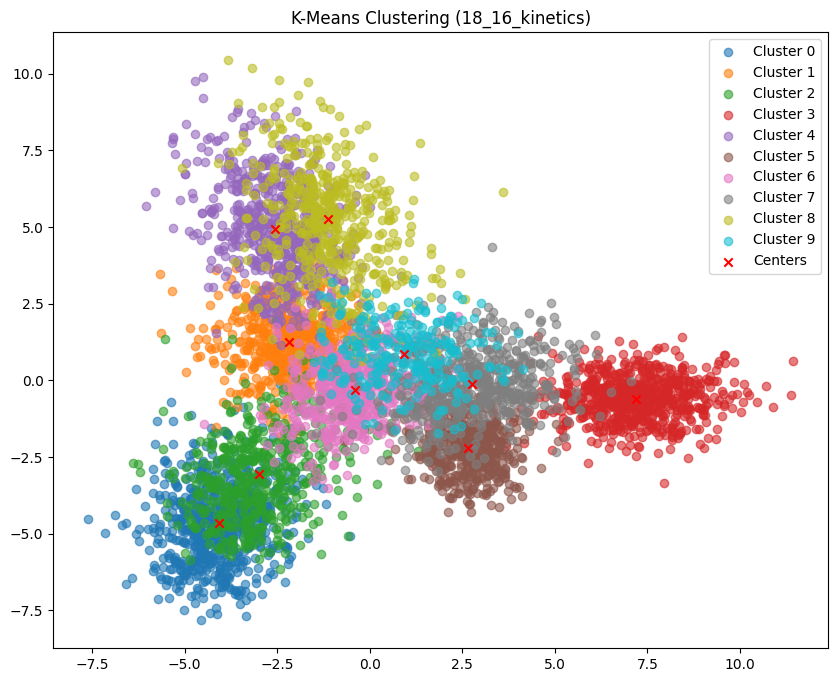

<ipython-input-8-3ef23c7f18ca>:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


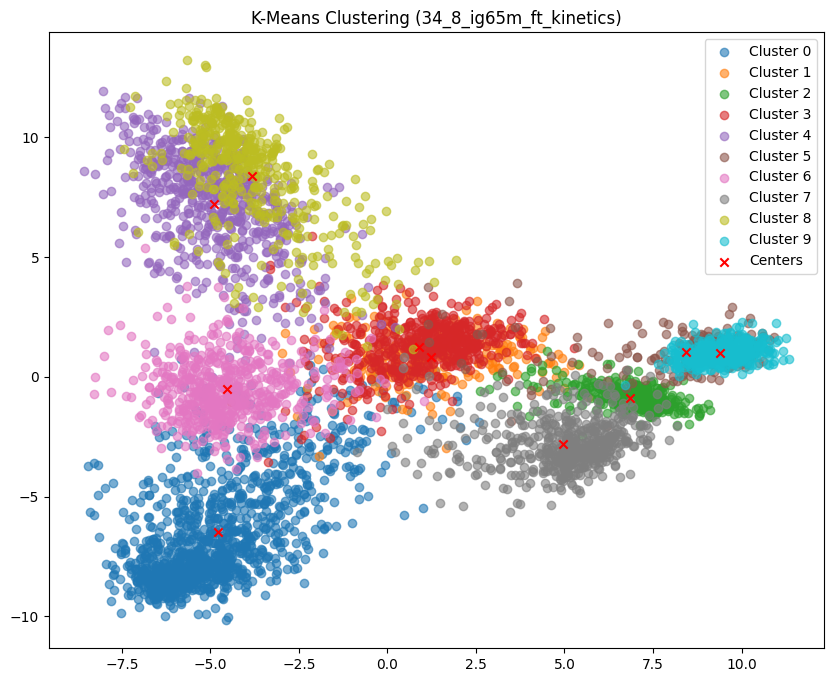

<ipython-input-8-3ef23c7f18ca>:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(unique_labels))


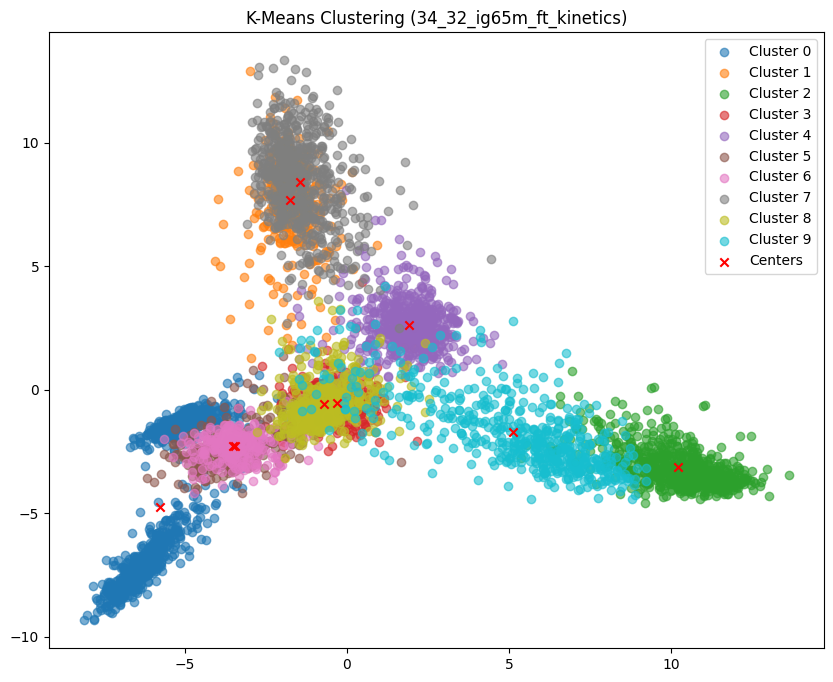

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap

class CustomKMeans:
    def __init__(self, n_clusters=10, max_iter=300, tol=1e-4):
        self.n_clusters = n_clusters
        self.max_iter = max_iter
        self.tol = tol

    def fit(self, X):
        np.random.seed(42)
        self.centers = X[np.random.choice(X.shape[0], self.n_clusters, replace=False)]

        for i in range(self.max_iter):
            self.labels = self._assign_clusters(X)
            new_centers = self._compute_centers(X)

            if np.all(np.abs(new_centers - self.centers) <= self.tol):
                break

            self.centers = new_centers

    def _assign_clusters(self, X):
        distances = np.linalg.norm(X[:, np.newaxis] - self.centers, axis=2)
        return np.argmin(distances, axis=1)

    def _compute_centers(self, X):
        centers = np.zeros((self.n_clusters, X.shape[1]))
        for i in range(self.n_clusters):
            centers[i] = X[self.labels == i].mean(axis=0)
        return centers

    def predict(self, X):
        return self._assign_clusters(X)

# Function to plot the clustering results
def plot_clusters(X, labels, centers, title):
    plt.figure(figsize=(10, 8))
    unique_labels = np.unique(labels)
    colors = plt.cm.get_cmap('tab10', len(unique_labels))

    for i, label in enumerate(unique_labels):
        plt.scatter(X[labels == label, 0], X[labels == label, 1],
                    c=[colors(i)], label=f'Cluster {label}', alpha=0.6)

    plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='x', label='Centers')
    plt.title(title)
    plt.legend()
    plt.show()

# Apply the custom K-Means to the given data
def apply_custom_kmeans(train_data, name):
    X = train_data.drop(['label', 'youtube_id'], axis=1).values

    # Use PCA to reduce dimensions to 50 for training
    pca_50 = PCA(n_components=50)
    X_pca_50 = pca_50.fit_transform(X)

    kmeans = CustomKMeans(n_clusters=10)
    kmeans.fit(X_pca_50)

    labels = kmeans.predict(X_pca_50)
    centers = kmeans.centers

    # Use PCA to reduce dimensions to 2 for visualization
    pca_2 = PCA(n_components=2)
    X_pca_2 = pca_2.fit_transform(X)
    centers_pca_2 = pca_2.transform(pca_50.inverse_transform(centers))

    plot_clusters(X_pca_2, labels, centers_pca_2, f"K-Means Clustering ({name})")

# Example usage with the three datasets
apply_custom_kmeans(train_data, '18_16_kinetics')
apply_custom_kmeans(train_data2, '34_8_ig65m_ft_kinetics')
apply_custom_kmeans(train_data3, '34_32_ig65m_ft_kinetics')


<ipython-input-17-649624e19b83>:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(pca_data_2d[:, 0], pca_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')


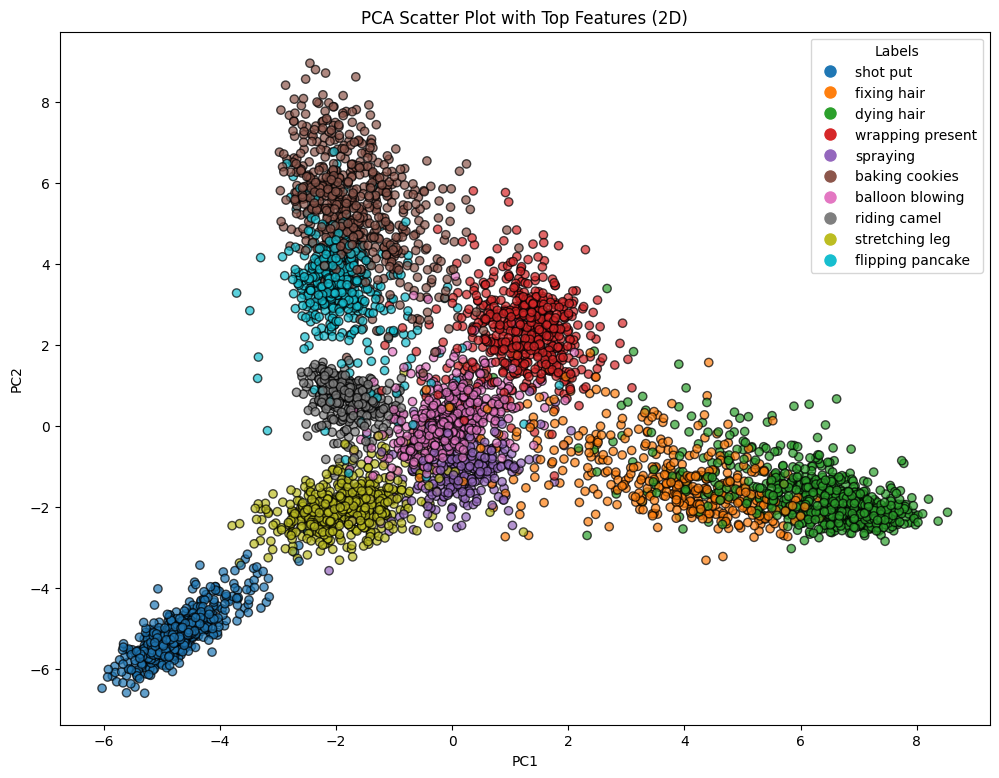

In [ ]:
top_n_features = feature_importance_df.head(top_n)['feature']

# Crear un nuevo DataFrame con las n características más importantes
X_top_n = train_data[top_n_features]

# Realizar PCA en 2D
pca_2d = PCA(n_components=2)
pca_data_2d = pca_2d.fit_transform(X_top_n)

# Gráfico 2D de PCA
plt.figure(figsize=(12, 9))
plt.scatter(pca_data_2d[:, 0], pca_data_2d[:, 1], c=colors, edgecolors='k', alpha=0.7, cmap='tab10')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA Scatter Plot with Top Features (2D)')

# Crear una leyenda con etiquetas únicas y sus colores correspondientes
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
plt.legend(handles=legend_elements, title="Labels")
plt.show()


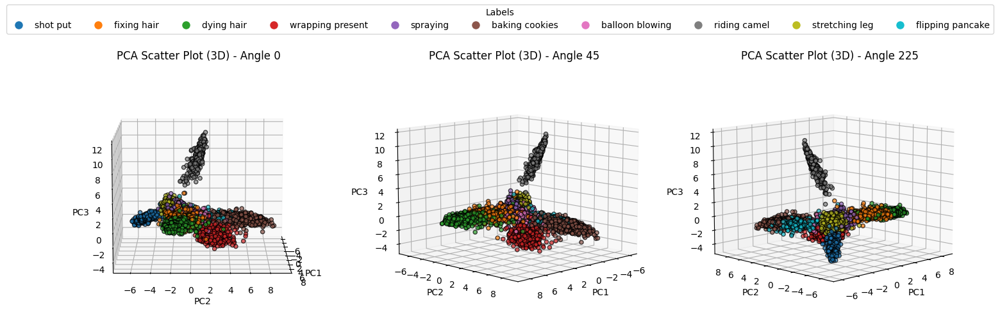

In [ ]:
# Realizar PCA en 3D
pca_3d = PCA(n_components=3)
pca_data_3d = pca_3d.fit_transform(X_top_n)

fig = plt.figure(figsize=(18, 6))

# Gráfico default
ax = fig.add_subplot(131, projection='3d')
plot_pca_3d(pca_data_3d, colors, 0, ax)

# Gráfico con azim=45
ax = fig.add_subplot(132, projection='3d')
plot_pca_3d(pca_data_3d, colors, 45, ax)

# Gráfico con azim=225
ax = fig.add_subplot(133, projection='3d')
plot_pca_3d(pca_data_3d, colors, 225, ax)

# Leyenda
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=plt.cm.tab10(color_map[label] % 10), markersize=10, label=label) for label in unique_labels]
fig.legend(handles=legend_elements, title="Labels", loc='upper center', ncol=len(unique_labels))

plt.show()

Vemos una ligera mejora, principalmente para las clases que estaban bastante unidas como marron y celeste, y verde y naranja, tambien es de notar que para la visualización 2D, el morado y el rosa se distinguen mucho mejor con en el pca de los top features que en el pca original.